In [2]:
# Get metadata object
import json
meta_data_file_path = "/fb-agios-acai-efs/Ego4D/ego4d_data/ego4d.json"

with open(meta_data_file_path, 'r') as meta_data_file:
    meta_data_obj = json.load(meta_data_file)

In [3]:
import os.path as osp
import json

# Get annotations
annotation_file_names = [n.strip() for n in """
fho_lta_debug_val.json
fho_lta_taxonomy.json
fho_lta_test_unannotated.json
fho_lta_train.json
fho_lta_train_10000.json
fho_lta_train_5000.json
fho_lta_val.json
""".split('\n') if len(n)> 0]
print(annotation_file_names)

annotation_file_dir = "/fb-agios-acai-efs/Ego4D/ego4d_data/v1/annotations"
annotation_file_name = {'train':"fho_lta_train.json",'val':'fho_lta_val.json','test':'fho_lta_test_unannotated.json'}['train']
assert annotation_file_name in annotation_file_names
annotation_file_path = osp.join(annotation_file_dir, annotation_file_name)

with open(annotation_file_path, 'r') as annotation_file:
    annotation_obj = json.load(annotation_file)


['fho_lta_debug_val.json', 'fho_lta_taxonomy.json', 'fho_lta_test_unannotated.json', 'fho_lta_train.json', 'fho_lta_train_10000.json', 'fho_lta_train_5000.json', 'fho_lta_val.json']


In [9]:
# Check out the annotations
# print(annotation_obj.keys())
print(annotation_obj)

"""
The clips indicate a unique action in a timeframe of a specific video.
There are multiple clips 'clip_uid' (and hence actions) per 'video_uid'.
e.g. search on video_uid '9c59e912-2340-4400-b2df-7db3d4066723', resulting in 74 unique clip_uids

Action-Label: is indicated by 'action_idx'.
"""

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



"\nThe clips indicate a unique action in a timeframe of a specific video.\nThere are multiple clips 'clip_uid' (and hence actions) per 'video_uid'.\ne.g. search on video_uid '9c59e912-2340-4400-b2df-7db3d4066723', resulting in 74 unique clip_uids\n\nAction-Label: is indicated by 'action_idx'.\n"

In [5]:
# Link to user in meta-data
meta_data_obj

{'date': '220407',
 'version': '1',
 'description': 'Ego4d Video Metadata',
 'videos': [{'video_uid': '77cc4654-4eec-44c6-af05-dbdf71f9a401',
   'duration_sec': 1247.13,
   'scenarios': ['Car - commuting, road trip', 'Talking with family members'],
   'video_metadata': {'fps': 30.0,
    'num_frames': 37414,
    'video_codec': 'libvpx-vp9',
    'audio_codec': 'aac',
    'display_resolution_width': 1920,
    'display_resolution_height': 1080,
    'sample_resolution_width': 1920,
    'sample_resolution_height': 1080,
    'mp4_duration_sec': 1247.13,
    'video_start_sec': 0.0,
    'video_duration_sec': 1247.13,
    'audio_start_sec': None,
    'audio_duration_sec': None,
    'video_start_pts': 0,
    'video_duration_pts': 19155968,
    'video_base_numerator': 1,
    'video_base_denominator': 15360,
    'audio_start_pts': None,
    'audio_duration_pts': None,
    'audio_base_numerator': None,
    'audio_base_denominator': None},
   'split_em': None,
   'split_av': None,
   'split_fho': Non

In [7]:
# If we want a video-agnostic histogram per user, we will need to merge the annotations with the video meta-data.
# Per-user, we need all the video_uids, and for all these videos we need to collect all 'clip_uids'.
# Per clip there is an associated action, which we want to count for the histogram.


# See pandas merging API: https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.merge.html
import pandas as pd
import numpy as np
from collections import Counter
np.warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)                 

pd.json_normalize(meta_data_obj) # L1 overview
video_df = pd.json_normalize(meta_data_obj['videos'])

video_df.head(n=50)

# Null/unassigned users are omitted automatically
scenarios_per_user_df = video_df.groupby(video_df['fb_participant_id'], as_index=False).agg({'scenarios':list,'video_uid':'count','duration_sec':'sum'})
scenarios_per_user_df['scenarios'] = scenarios_per_user_df['scenarios'].apply(np.concatenate).apply(Counter) # FLATTEN
scenarios_per_user_df = scenarios_per_user_df.rename(columns={"video_uid":"video_count"})
scenarios_per_user_df

,fb_participant_id,scenarios,video_count,duration_sec
0,8.0,{'Crafting/knitting/sewing/drawing/painting': 8},8,22002.95
1,9.0,"{'Playing cards': 1, 'Gardening': 2}",3,3875.60
2,10.0,"{'Household management - caring for kids': 4, ...",10,8202.33
3,11.0,"{'Household management - caring for kids': 37,...",38,27094.81
4,12.0,{'Crafting/knitting/sewing/drawing/painting': 23},23,39797.95
...,...,...,...,...
808,872.0,{'Climbing': 2},2,11913.56
809,873.0,{'Climbing': 2},2,4961.87
810,874.0,{'Climbing': 1},1,2930.60
811,875.0,"{'On a screen (phone/laptop)': 1, 'Tourism': 1...",1,3093.23


In [25]:
import pandas as pd
import numpy as np
from collections import Counter
np.warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)                 

pd.json_normalize(annotation_obj) # L1 overview
labeled_clips_df = pd.json_normalize(annotation_obj['clips'])

labeled_clips_df.loc[labeled_clips_df['clip_id'] == 1805] # SELECT WHERE...


,video_uid,clip_uid,clip_parent_start_sec,clip_parent_end_sec,clip_parent_start_frame,clip_parent_end_frame,interval_start_frame,interval_end_frame,interval_start_sec,interval_end_sec,verb,noun,action_clip_start_sec,action_clip_end_sec,action_clip_start_frame,action_clip_end_frame,clip_id,action_idx,verb_label,noun_label
0,9c59e912-2340-4400-b2df-7db3d4066723,b6a88030-b904-4f06-89b4-d2c8eb219bf6,0.0,308.0,0,9239,0,8999,0.0,300.0,"put_(place,_leave,_drop)","mower_(lawnmower,_mower)",2.487695,10.487695,74,314,1805,0,65,259
1,9c59e912-2340-4400-b2df-7db3d4066723,b6a88030-b904-4f06-89b4-d2c8eb219bf6,0.0,308.0,0,9239,0,8999,0.0,300.0,"adjust_(regulate,_increase/reduce,_change)","mower_(lawnmower,_mower)",6.521029,14.521029,195,435,1805,1,0,259
2,9c59e912-2340-4400-b2df-7db3d4066723,b6a88030-b904-4f06-89b4-d2c8eb219bf6,0.0,308.0,0,9239,0,8999,0.0,300.0,"put_(place,_leave,_drop)",glove,15.287695,23.287695,458,698,1805,2,65,182
3,9c59e912-2340-4400-b2df-7db3d4066723,b6a88030-b904-4f06-89b4-d2c8eb219bf6,0.0,308.0,0,9239,0,8999,0.0,300.0,"cut_(trim,_slice,_chop)",grass,22.454362,30.454362,673,913,1805,3,16,190
4,9c59e912-2340-4400-b2df-7db3d4066723,b6a88030-b904-4f06-89b4-d2c8eb219bf6,0.0,308.0,0,9239,0,8999,0.0,300.0,repair,"mower_(lawnmower,_mower)",43.221029,51.221029,1296,1536,1805,4,68,259
5,9c59e912-2340-4400-b2df-7db3d4066723,b6a88030-b904-4f06-89b4-d2c8eb219bf6,0.0,308.0,0,9239,0,8999,0.0,300.0,pull,"mower_(lawnmower,_mower)",52.621029,60.621029,1578,1818,1805,5,62,259
6,9c59e912-2340-4400-b2df-7db3d4066723,b6a88030-b904-4f06-89b4-d2c8eb219bf6,0.0,308.0,0,9239,0,8999,0.0,300.0,open,door,59.387695,67.387695,1781,2021,1805,6,50,129
7,9c59e912-2340-4400-b2df-7db3d4066723,b6a88030-b904-4f06-89b4-d2c8eb219bf6,0.0,308.0,0,9239,0,8999,0.0,300.0,"take_(pick,_grab,_get)","container_(box,_can,_carton,_case,_casing,_con...",64.554362,72.554362,1936,2176,1805,7,92,105
8,9c59e912-2340-4400-b2df-7db3d4066723,b6a88030-b904-4f06-89b4-d2c8eb219bf6,0.0,308.0,0,9239,0,8999,0.0,300.0,"put_(place,_leave,_drop)","oil_(fat,_oil)",82.254362,90.254362,2467,2707,1805,8,65,272
9,9c59e912-2340-4400-b2df-7db3d4066723,b6a88030-b904-4f06-89b4-d2c8eb219bf6,0.0,308.0,0,9239,0,8999,0.0,300.0,repair,"mower_(lawnmower,_mower)",123.787695,131.787695,3713,3953,1805,9,68,259


There is one entry per supervision-label. This may contain multiple clips and multiple video fragments.
A clip can be a sub-video of the parent video (probably because some videos very long for continuous labeling). One clip_id has multiple entries for all actions happening in that clip.

The action label is identified by ('verb','noun') or ('verb_label','noun_label'). Don't use 'action_idx', this indicates the 'action-idx'-th action in a clip (action counter)!

Multiple actions can happen at the same time! (Overlap in clip time ranges)

We don't really need the clip_id, we can use the video_id to link it to the user.

In [27]:
# First link labels to videos - INNER JOIN of meta-object and labels-object
print(video_df.shape)
print(f"labels_df={labeled_clips_df.shape}")
joined_df = pd.merge(video_df, labeled_clips_df, on="video_uid") # Inner-join (Intersection of  video-uid values)
print(f"joined_df={joined_df.shape} -> Good, should have same #rows as labels-df, only keys are extended with info from meta-data object, such as user id etc")
joined_df

# Then group by user and aggregate columns
user_df = joined_df.groupby(video_df['fb_participant_id'], as_index=False).agg(
    {'scenarios':list,'verb':list,'noun':list, 'verb_label':list, 'noun_label':list,
     'video_uid':'count','duration_sec':'sum'})
user_df['scenarios'] = user_df['scenarios'].apply(np.concatenate) # FLATTEN
user_df

(9645, 54)
labels_df=(23610, 20)
joined_df=(23610, 73) -> Good, should have same #rows as labels-df, only keys are extended with info from meta-data object, such as user id etc


,scenarios,verb,noun,verb_label,noun_label,video_uid,duration_sec
0,"[Making Bricks, Blacksmith, Crafting/knitting/...","[pack, move_(transfer,_pass,_exchange), open, ...","[clay, grinder, book_(book,_booklet,_magazine,...","[52, 49, 50, 65, 65, 60, 99, 65]","[94, 193, 38, 297, 225, 274, 253, 312]",8,21789.84
1,"[Cooking, Household management - caring for ki...","[put_(place,_leave,_drop), wipe, put_(place,_l...","[book_(book,_booklet,_magazine,_manual,_notebo...","[65, 112, 65]","[38, 59, 131]",3,9341.60
2,"[Making Bricks, Household management - caring ...","[draw, put_(place,_leave,_drop), put_(place,_l...","[mold_(mold,_molder,_mould), container_(box,_c...","[21, 65, 65, 112, 108, 11, 9, 60, 1, 65]","[253, 105, 449, 225, 233, 275, 158, 369, 264, ...",10,29279.84
3,"[Crafting/knitting/sewing/drawing/painting, jo...","[remove, put_(place,_leave,_drop), lift, put_(...","[paintbrush, glove, glove, scraper_(scraper,_s...","[67, 65, 42, 65, 65, 50, 41, 49, 49, 65, 16, 8...","[279, 182, 182, 351, 253, 475, 97, 131, 131, 1...",38,108241.46
4,"[Crafting/knitting/sewing/drawing/painting, jo...","[remove, put_(place,_leave,_drop), close, open...","[brush, carpet, faucet_(faucet,_tap), drawer, ...","[67, 65, 11, 50, 0, 40, 35, 35, 65, 60, 64, 10...","[50, 69, 150, 134, 38, 131, 105, 281, 299, 379...",23,61600.12
...,...,...,...,...,...,...,...
808,"[Household management - caring for kids, Makin...","[take_(pick,_grab,_get), pour]","[iron, sand]","[92, 60]","[216, 341]",2,8661.17
809,"[Cooking, Blacksmith]","[put_(place,_leave,_drop), weld]","[plate_(dish,_plate,_platter,_saucer), solder_...","[65, 111]","[313, 380]",2,3317.74
810,[Household management - caring for kids],"[put_(place,_leave,_drop)]","[shirt_(cardigan,_shirt,_sweater,_sweatshirt,_...",[65],[364],1,3325.37
811,[Cleaning / laundry],"[put_(place,_leave,_drop)]","[plate_(dish,_plate,_platter,_saucer)]",[65],[313],1,1142.97


In [35]:
# .apply(Counter) # FLATTEN
# scenarios_per_user_df = scenarios_per_user_df.rename(columns={"video_uid":"video_count"})
# scenarios_per_user_df

print({user_df.columns.get_loc(c): c for idx, c in enumerate(user_df.columns)})


# MERGE (verb,noun) columns
user_df['action_label'] = user_df.loc[:,'verb_label':'noun_label'].apply(
    lambda x: [f"{l}-{r}" for l,r in zip(x[0],x[1])],
    axis=1
)
user_df['action'] = user_df.loc[:,'verb':'noun'].apply(
    lambda x: [f"{l}-{r}" for l,r in zip(x[0],x[1])],
    axis=1
)
user_df

{0: 'scenarios', 1: 'verb', 2: 'noun', 3: 'verb_label', 4: 'noun_label', 5: 'video_uid', 6: 'duration_sec', 7: 'action_label', 8: 'action'}


,scenarios,verb,noun,verb_label,noun_label,video_uid,duration_sec,action_label,action
0,"[Making Bricks, Blacksmith, Crafting/knitting/...","[pack, move_(transfer,_pass,_exchange), open, ...","[clay, grinder, book_(book,_booklet,_magazine,...","[52, 49, 50, 65, 65, 60, 99, 65]","[94, 193, 38, 297, 225, 274, 253, 312]",8,21789.84,"[52-94, 49-193, 50-38, 65-297, 65-225, 60-274,...","[pack-clay, move_(transfer,_pass,_exchange)-gr..."
1,"[Cooking, Household management - caring for ki...","[put_(place,_leave,_drop), wipe, put_(place,_l...","[book_(book,_booklet,_magazine,_manual,_notebo...","[65, 112, 65]","[38, 59, 131]",3,9341.60,"[65-38, 112-59, 65-131]","[put_(place,_leave,_drop)-book_(book,_booklet,..."
2,"[Making Bricks, Household management - caring ...","[draw, put_(place,_leave,_drop), put_(place,_l...","[mold_(mold,_molder,_mould), container_(box,_c...","[21, 65, 65, 112, 108, 11, 9, 60, 1, 65]","[253, 105, 449, 225, 233, 275, 158, 369, 264, ...",10,29279.84,"[21-253, 65-105, 65-449, 112-225, 108-233, 11-...","[draw-mold_(mold,_molder,_mould), put_(place,_..."
3,"[Crafting/knitting/sewing/drawing/painting, jo...","[remove, put_(place,_leave,_drop), lift, put_(...","[paintbrush, glove, glove, scraper_(scraper,_s...","[67, 65, 42, 65, 65, 50, 41, 49, 49, 65, 16, 8...","[279, 182, 182, 351, 253, 475, 97, 131, 131, 1...",38,108241.46,"[67-279, 65-182, 42-182, 65-351, 65-253, 50-47...","[remove-paintbrush, put_(place,_leave,_drop)-g..."
4,"[Crafting/knitting/sewing/drawing/painting, jo...","[remove, put_(place,_leave,_drop), close, open...","[brush, carpet, faucet_(faucet,_tap), drawer, ...","[67, 65, 11, 50, 0, 40, 35, 35, 65, 60, 64, 10...","[50, 69, 150, 134, 38, 131, 105, 281, 299, 379...",23,61600.12,"[67-50, 65-69, 11-150, 50-134, 0-38, 40-131, 3...","[remove-brush, put_(place,_leave,_drop)-carpet..."
...,...,...,...,...,...,...,...,...,...
808,"[Household management - caring for kids, Makin...","[take_(pick,_grab,_get), pour]","[iron, sand]","[92, 60]","[216, 341]",2,8661.17,"[92-216, 60-341]","[take_(pick,_grab,_get)-iron, pour-sand]"
809,"[Cooking, Blacksmith]","[put_(place,_leave,_drop), weld]","[plate_(dish,_plate,_platter,_saucer), solder_...","[65, 111]","[313, 380]",2,3317.74,"[65-313, 111-380]","[put_(place,_leave,_drop)-plate_(dish,_plate,_..."
810,[Household management - caring for kids],"[put_(place,_leave,_drop)]","[shirt_(cardigan,_shirt,_sweater,_sweatshirt,_...",[65],[364],1,3325.37,[65-364],"[put_(place,_leave,_drop)-shirt_(cardigan,_shi..."
811,[Cleaning / laundry],"[put_(place,_leave,_drop)]","[plate_(dish,_plate,_platter,_saucer)]",[65],[313],1,1142.97,[65-313],"[put_(place,_leave,_drop)-plate_(dish,_plate,_..."


In [38]:
# APPLY COUNTER OBJECTS ON ACTIONS
user_action_freq_df = user_df.copy(deep=True)
user_action_freq_df['action_label_count'] = user_action_freq_df['action_label'].apply(Counter)
user_action_freq_df['action_count'] = user_action_freq_df['action'].apply(Counter)
user_action_freq_df

,scenarios,verb,noun,verb_label,noun_label,video_uid,duration_sec,action_label,action,action_label_count,action_count
0,"[Making Bricks, Blacksmith, Crafting/knitting/...","[pack, move_(transfer,_pass,_exchange), open, ...","[clay, grinder, book_(book,_booklet,_magazine,...","[52, 49, 50, 65, 65, 60, 99, 65]","[94, 193, 38, 297, 225, 274, 253, 312]",8,21789.84,"[52-94, 49-193, 50-38, 65-297, 65-225, 60-274,...","[pack-clay, move_(transfer,_pass,_exchange)-gr...","{'52-94': 1, '49-193': 1, '50-38': 1, '65-297'...","{'pack-clay': 1, 'move_(transfer,_pass,_exchan..."
1,"[Cooking, Household management - caring for ki...","[put_(place,_leave,_drop), wipe, put_(place,_l...","[book_(book,_booklet,_magazine,_manual,_notebo...","[65, 112, 65]","[38, 59, 131]",3,9341.60,"[65-38, 112-59, 65-131]","[put_(place,_leave,_drop)-book_(book,_booklet,...","{'65-38': 1, '112-59': 1, '65-131': 1}","{'put_(place,_leave,_drop)-book_(book,_booklet..."
2,"[Making Bricks, Household management - caring ...","[draw, put_(place,_leave,_drop), put_(place,_l...","[mold_(mold,_molder,_mould), container_(box,_c...","[21, 65, 65, 112, 108, 11, 9, 60, 1, 65]","[253, 105, 449, 225, 233, 275, 158, 369, 264, ...",10,29279.84,"[21-253, 65-105, 65-449, 112-225, 108-233, 11-...","[draw-mold_(mold,_molder,_mould), put_(place,_...","{'21-253': 1, '65-105': 2, '65-449': 1, '112-2...","{'draw-mold_(mold,_molder,_mould)': 1, 'put_(p..."
3,"[Crafting/knitting/sewing/drawing/painting, jo...","[remove, put_(place,_leave,_drop), lift, put_(...","[paintbrush, glove, glove, scraper_(scraper,_s...","[67, 65, 42, 65, 65, 50, 41, 49, 49, 65, 16, 8...","[279, 182, 182, 351, 253, 475, 97, 131, 131, 1...",38,108241.46,"[67-279, 65-182, 42-182, 65-351, 65-253, 50-47...","[remove-paintbrush, put_(place,_leave,_drop)-g...","{'67-279': 1, '65-182': 1, '42-182': 1, '65-35...","{'remove-paintbrush': 1, 'put_(place,_leave,_d..."
4,"[Crafting/knitting/sewing/drawing/painting, jo...","[remove, put_(place,_leave,_drop), close, open...","[brush, carpet, faucet_(faucet,_tap), drawer, ...","[67, 65, 11, 50, 0, 40, 35, 35, 65, 60, 64, 10...","[50, 69, 150, 134, 38, 131, 105, 281, 299, 379...",23,61600.12,"[67-50, 65-69, 11-150, 50-134, 0-38, 40-131, 3...","[remove-brush, put_(place,_leave,_drop)-carpet...","{'67-50': 1, '65-69': 1, '11-150': 1, '50-134'...","{'remove-brush': 1, 'put_(place,_leave,_drop)-..."
...,...,...,...,...,...,...,...,...,...,...,...
808,"[Household management - caring for kids, Makin...","[take_(pick,_grab,_get), pour]","[iron, sand]","[92, 60]","[216, 341]",2,8661.17,"[92-216, 60-341]","[take_(pick,_grab,_get)-iron, pour-sand]","{'92-216': 1, '60-341': 1}","{'take_(pick,_grab,_get)-iron': 1, 'pour-sand'..."
809,"[Cooking, Blacksmith]","[put_(place,_leave,_drop), weld]","[plate_(dish,_plate,_platter,_saucer), solder_...","[65, 111]","[313, 380]",2,3317.74,"[65-313, 111-380]","[put_(place,_leave,_drop)-plate_(dish,_plate,_...","{'65-313': 1, '111-380': 1}","{'put_(place,_leave,_drop)-plate_(dish,_plate,..."
810,[Household management - caring for kids],"[put_(place,_leave,_drop)]","[shirt_(cardigan,_shirt,_sweater,_sweatshirt,_...",[65],[364],1,3325.37,[65-364],"[put_(place,_leave,_drop)-shirt_(cardigan,_shi...",{'65-364': 1},"{'put_(place,_leave,_drop)-shirt_(cardigan,_sh..."
811,[Cleaning / laundry],"[put_(place,_leave,_drop)]","[plate_(dish,_plate,_platter,_saucer)]",[65],[313],1,1142.97,[65-313],"[put_(place,_leave,_drop)-plate_(dish,_plate,_...",{'65-313': 1},"{'put_(place,_leave,_drop)-plate_(dish,_plate,..."


In [53]:
# GET NORMALIZED DISTRS FROM COUNTER OBJECTS
user_action_freq_df['action_distr'] = user_action_freq_df['action_count'].apply(
    lambda x:sorted([el/sum(list(x.values())) for el in x.values()],reverse=True)
)

# Max nb of different scenarios for 1 user (for zero padding the rest for means/stds)
max_action_list_len = user_action_freq_df['action_distr'].apply(len).max()
print(max_action_list_len)

# Append zero counts for others
user_action_freq_df['action_distr'] = user_action_freq_df['action_distr'].apply(
    lambda x:np.pad(x,(0,max_action_list_len - len(x)))
)

user_action_freq_df

# user_action_freq_df
# # Normalize with total nb of scenarios
# scenario_freqs_per_user_df['scenarios'] = scenario_freqs_per_user_df['scenarios'].apply(lambda x:[ el/sum(x) for el in x])

# scenarios_per_user_df = scenarios_per_user_df.rename(columns={"video_uid":"video_count"})
# scenarios_per_user_df

174


,scenarios,verb,noun,verb_label,noun_label,video_uid,duration_sec,action_label,action,action_label_count,action_count,action_distr
0,"[Making Bricks, Blacksmith, Crafting/knitting/...","[pack, move_(transfer,_pass,_exchange), open, ...","[clay, grinder, book_(book,_booklet,_magazine,...","[52, 49, 50, 65, 65, 60, 99, 65]","[94, 193, 38, 297, 225, 274, 253, 312]",8,21789.84,"[52-94, 49-193, 50-38, 65-297, 65-225, 60-274,...","[pack-clay, move_(transfer,_pass,_exchange)-gr...","{'52-94': 1, '49-193': 1, '50-38': 1, '65-297'...","{'pack-clay': 1, 'move_(transfer,_pass,_exchan...","[0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.1..."
1,"[Cooking, Household management - caring for ki...","[put_(place,_leave,_drop), wipe, put_(place,_l...","[book_(book,_booklet,_magazine,_manual,_notebo...","[65, 112, 65]","[38, 59, 131]",3,9341.60,"[65-38, 112-59, 65-131]","[put_(place,_leave,_drop)-book_(book,_booklet,...","{'65-38': 1, '112-59': 1, '65-131': 1}","{'put_(place,_leave,_drop)-book_(book,_booklet...","[0.3333333333333333, 0.3333333333333333, 0.333..."
2,"[Making Bricks, Household management - caring ...","[draw, put_(place,_leave,_drop), put_(place,_l...","[mold_(mold,_molder,_mould), container_(box,_c...","[21, 65, 65, 112, 108, 11, 9, 60, 1, 65]","[253, 105, 449, 225, 233, 275, 158, 369, 264, ...",10,29279.84,"[21-253, 65-105, 65-449, 112-225, 108-233, 11-...","[draw-mold_(mold,_molder,_mould), put_(place,_...","{'21-253': 1, '65-105': 2, '65-449': 1, '112-2...","{'draw-mold_(mold,_molder,_mould)': 1, 'put_(p...","[0.2, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, ..."
3,"[Crafting/knitting/sewing/drawing/painting, jo...","[remove, put_(place,_leave,_drop), lift, put_(...","[paintbrush, glove, glove, scraper_(scraper,_s...","[67, 65, 42, 65, 65, 50, 41, 49, 49, 65, 16, 8...","[279, 182, 182, 351, 253, 475, 97, 131, 131, 1...",38,108241.46,"[67-279, 65-182, 42-182, 65-351, 65-253, 50-47...","[remove-paintbrush, put_(place,_leave,_drop)-g...","{'67-279': 1, '65-182': 1, '42-182': 1, '65-35...","{'remove-paintbrush': 1, 'put_(place,_leave,_d...","[0.05263157894736842, 0.02631578947368421, 0.0..."
4,"[Crafting/knitting/sewing/drawing/painting, jo...","[remove, put_(place,_leave,_drop), close, open...","[brush, carpet, faucet_(faucet,_tap), drawer, ...","[67, 65, 11, 50, 0, 40, 35, 35, 65, 60, 64, 10...","[50, 69, 150, 134, 38, 131, 105, 281, 299, 379...",23,61600.12,"[67-50, 65-69, 11-150, 50-134, 0-38, 40-131, 3...","[remove-brush, put_(place,_leave,_drop)-carpet...","{'67-50': 1, '65-69': 1, '11-150': 1, '50-134'...","{'remove-brush': 1, 'put_(place,_leave,_drop)-...","[0.08695652173913043, 0.043478260869565216, 0...."
...,...,...,...,...,...,...,...,...,...,...,...,...
808,"[Household management - caring for kids, Makin...","[take_(pick,_grab,_get), pour]","[iron, sand]","[92, 60]","[216, 341]",2,8661.17,"[92-216, 60-341]","[take_(pick,_grab,_get)-iron, pour-sand]","{'92-216': 1, '60-341': 1}","{'take_(pick,_grab,_get)-iron': 1, 'pour-sand'...","[0.5, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
809,"[Cooking, Blacksmith]","[put_(place,_leave,_drop), weld]","[plate_(dish,_plate,_platter,_saucer), solder_...","[65, 111]","[313, 380]",2,3317.74,"[65-313, 111-380]","[put_(place,_leave,_drop)-plate_(dish,_plate,_...","{'65-313': 1, '111-380': 1}","{'put_(place,_leave,_drop)-plate_(dish,_plate,...","[0.5, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
810,[Household management - caring for kids],"[put_(place,_leave,_drop)]","[shirt_(cardigan,_shirt,_sweater,_sweatshirt,_...",[65],[364],1,3325.37,[65-364],"[put_(place,_leave,_drop)-shirt_(cardigan,_shi...",{'65-364': 1},"{'put_(place,_leave,_drop)-shirt_(cardigan,_sh...","[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
811,[Cleaning / laundry],"[put_(place,_leave,_drop)]","[plate_(dish,_plate,_platter,_saucer)]",[65],[313],1,1142.97,[65-313],"[put_(place,_leave,_drop)-plate_(dish,_plate,_...",{'65-313': 1},"{'put_(place,_leave,_drop)-plate_(dish,_plate,...","[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 

(174, 813)


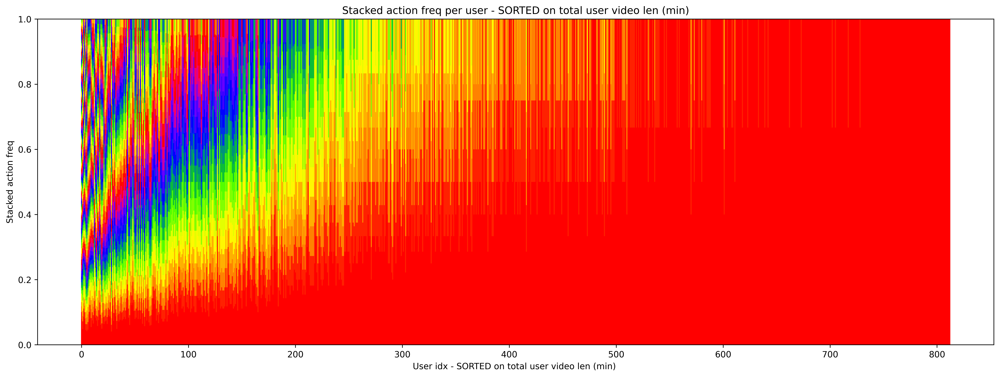

<Figure size 432x288 with 0 Axes>

In [55]:
# Other visualisation: users on x-axis and y-axis is multi-barplot where scenarios ordered on freq
import matplotlib.pyplot as plt
import numpy as np

def check_sum_one(list_of_distr):
    eps = 1e-5
    for distr in list_of_distr:
        prob_sum = sum(distr)
        assert 1-eps < prob_sum < 1 + eps, f"prob_sum={prob_sum} NOT SUMMING TO ONE"
        
df_sorted = user_action_freq_df.sort_values(by=['duration_sec'],ascending=False)
video_lens_s = df_sorted['duration_sec'].tolist()
# print(df_sorted)

# Stack bar plots: 
stack_user_counts_s = df_sorted['action_distr'].tolist()
check_sum_one(stack_user_counts_s)

# Transpose: List of 1st entries over users, list of 2nd entries, etc
stack_user_counts_st = np.asarray(stack_user_counts_s)
check_sum_one(stack_user_counts_st)
stack_user_counts_st = stack_user_counts_st.transpose()
print(stack_user_counts_st.shape)

plt.figure(figsize=(20, 7), dpi=600) # So all bars are visible!
x_axis = list(range(len(stack_user_counts_st[0])))

# my_cmap = plt.get_cmap("hsv")
my_cmap = plt.get_cmap("prism")
color_steps = np.linspace(0, 1, len(stack_user_counts_st))

# Config
bar_width = 1

# First bar
prev_bar_values = stack_user_counts_st[0]
plt.bar(x_axis, height=prev_bar_values, align='center', width=bar_width,color=my_cmap(color_steps[0]))
for idx, stack_user_count in enumerate(stack_user_counts_st[1:]):
    color = my_cmap(color_steps[idx+1])
    plt.bar(x_axis, height=stack_user_count, color=color,bottom=prev_bar_values, align='center', width=bar_width)
    
    assert len(prev_bar_values) == len(stack_user_count.tolist())
    prev_bar_values = [x+y for x,y in zip(prev_bar_values,stack_user_count.tolist())]


plt.ylim(None,None)
plt.xlim(None,None)
plt.xlabel("User idx - SORTED on total user video len (min) ")
plt.ylabel("Stacked action freq")
plt.title("Stacked action freq per user - SORTED on total user video len (min)")

# plt.grid(grid)
plt.show()
plt.clf()
